In [1]:
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure
import numpy as np

%matplotlib inline

matplotlib.rcParams['figure.figsize'] = (12,8)

In [2]:
##read data


df = pd.read_csv('movies.csv')

In [3]:
df.head()

,Company,Country,Director,Genre,Name,Rating,released,Star,Writer,Year,Budget,Gross,Runtime,Score,Votes
0,Warner Bros.,United Kingdom,Stanley Kubrick,Drama,The Shining,R,6-13-1980,Jack Nicholson,Stephen King,1980,19000000.0,46998772.0,146.0,8.4,927000.0
1,Columbia Pictures,United States,Randal Kleiser,Adventure,The Blue Lagoon,R,7-2-1980,Brooke Shields,Henry De Vere Stacpoole,1980,4500000.0,58853106.0,104.0,5.8,65000.0
2,Lucasfilm,United States,Irvin Kershner,Action,Star Wars: Episode V - The Empire Strikes Back,PG,6-20-1980,Mark Hamill,Leigh Brackett,1980,18000000.0,538375067.0,124.0,8.7,1200000.0
3,Paramount Pictures,United States,Jim Abrahams,Comedy,Airplane!,PG,7-2-1980,Robert Hays,Jim Abrahams,1980,3500000.0,83453539.0,88.0,7.7,221000.0
4,Orion Pictures,United States,Harold Ramis,Comedy,Caddyshack,R,7-25-1980,Chevy Chase,Brian Doyle-Murray,1980,6000000.0,39846344.0,98.0,7.3,108000.0


In [4]:
df.count()

Company     7651
Country     7665
Director    7668
Genre       7668
Name        7668
Rating      7591
released    7080
Star        7667
Writer      7665
Year        7668
Budget      5497
Gross       7479
Runtime     7664
Score       7665
Votes       7665
dtype: int64

In [5]:
## finding missing data or not

df.isnull().sum()



Company       17
Country        3
Director       0
Genre          0
Name           0
Rating        77
released     588
Star           1
Writer         3
Year           0
Budget      2171
Gross        189
Runtime        4
Score          3
Votes          3
dtype: int64

In [6]:

for col in df.columns:
    missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col,missing))

Company - 0.002217005738132499%
Country - 0.0003912363067292645%
Director - 0.0%
Genre - 0.0%
Name - 0.0%
Rating - 0.010041731872717789%
released - 0.07668231611893583%
Star - 0.00013041210224308815%
Writer - 0.0003912363067292645%
Year - 0.0%
Budget - 0.2831246739697444%
Gross - 0.02464788732394366%
Runtime - 0.0005216484089723526%
Score - 0.0003912363067292645%
Votes - 0.0003912363067292645%


In [52]:
df.dtypes

Company          object
Country          object
Director         object
Genre            object
Name             object
Rating           object
released         object
Star             object
Writer           object
Year              int64
Budget            Int64
Gross             Int64
Runtime          object
Score           float64
Votes           float64
correct_year     object
dtype: object

In [53]:
df['Gross'] = df['Gross'].astype('float64')
df['Budget'] = df['Budget'].astype('float64')

In [9]:
df['correct_year'] = df['released'].astype(str).str[-4:]
df['correct_year']

0       1980
1       1980
2       1980
3       1980
4       1980
        ... 
7663    2020
7664    2020
7665     nan
7666    2020
7667    2020
Name: correct_year, Length: 7668, dtype: object

In [10]:
df['released']

0        6-13-1980
1         7-2-1980
2        6-20-1980
3         7-2-1980
4        7-25-1980
           ...    
7663    10-23-2020
7664      2-7-2020
7665           NaN
7666     10-1-2020
7667     8-19-2020
Name: released, Length: 7668, dtype: object

In [11]:
df[['correct_year','released']]

,correct_year,released
0,1980,6-13-1980
1,1980,7-2-1980
2,1980,6-20-1980
3,1980,7-2-1980
4,1980,7-25-1980
...,...,...
7663,2020,10-23-2020
7664,2020,2-7-2020
7665,nan,NaN
7666,2020,10-1-2020


In [12]:
df.sort_values(by=['Gross'], inplace = False, ascending = False)

,Company,Country,Director,Genre,Name,Rating,released,Star,Writer,Year,Budget,Gross,Runtime,Score,Votes,correct_year
5445,Twentieth Century Fox,United States,James Cameron,Action,Avatar,PG-13,12-18-2009,Sam Worthington,James Cameron,2009,237000000,2847246203,162.0,7.8,1100000.0,2009
7445,Marvel Studios,United States,Anthony Russo,Action,Avengers: Endgame,PG-13,4-26-2019,Robert Downey Jr.,Christopher Markus,2019,356000000,2797501328,181.0,8.4,903000.0,2019
3045,Twentieth Century Fox,United States,James Cameron,Drama,Titanic,PG-13,12-19-1997,Leonardo DiCaprio,James Cameron,1997,200000000,2201647264,194.0,7.8,1100000.0,1997
6663,Lucasfilm,United States,J.J. Abrams,Action,Star Wars: Episode VII - The Force Awakens,PG-13,12-18-2015,Daisy Ridley,Lawrence Kasdan,2015,245000000,2069521700,138.0,7.8,876000.0,2015
7244,Marvel Studios,United States,Anthony Russo,Action,Avengers: Infinity War,PG-13,4-27-2018,Robert Downey Jr.,Christopher Markus,2018,321000000,2048359754,149.0,8.4,897000.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,NaN,United States,Joseph Ebanks,Drama,More to Life,NaN,10-23-2020,Shannon Bond,Joseph Ebanks,2020,7000,<NA>,90.0,3.1,18.0,2020
7664,Cactus Blue Entertainment,United States,Dusty Dukatz,Comedy,Dream Round,NaN,2-7-2020,Michael Saquella,Lisa Huston,2020,<NA>,<NA>,90.0,4.7,36.0,2020
7665,Embi Productions,United States,Nkanya Nkwai,Drama,Saving Mbango,NaN,NaN,Onyama Laura,Lynno Lovert,2020,58750,<NA>,NaN,5.7,29.0,nan
7666,NaN,United States,James Randall,Drama,It's Just Us,NaN,10-1-2020,Christina Roz,James Randall,2020,15000,<NA>,120.0,NaN,NaN,2020


In [13]:
df['Company'].isnull().sum()

17

In [14]:
df = df.dropna(subset=['Company'])
df = df.dropna(axis = 0, subset=['Budget','Gross'], thresh = 2)

In [15]:
df['Rating'].fillna("Not Rated", inplace = True)

In [22]:
df.head()

,Company,Country,Director,Genre,Name,Rating,released,Star,Writer,Year,Budget,Gross,Runtime,Score,Votes,correct_year
0,Warner Bros.,United Kingdom,Stanley Kubrick,Drama,The Shining,R,6-13-1980,Jack Nicholson,Stephen King,1980,19000000,46998772,146.0,8.4,927000.0,1980
1,Columbia Pictures,United States,Randal Kleiser,Adventure,The Blue Lagoon,R,7-2-1980,Brooke Shields,Henry De Vere Stacpoole,1980,4500000,58853106,104.0,5.8,65000.0,1980
2,Lucasfilm,United States,Irvin Kershner,Action,Star Wars: Episode V - The Empire Strikes Back,PG,6-20-1980,Mark Hamill,Leigh Brackett,1980,18000000,538375067,124.0,8.7,1200000.0,1980
3,Paramount Pictures,United States,Jim Abrahams,Comedy,Airplane!,PG,7-2-1980,Robert Hays,Jim Abrahams,1980,3500000,83453539,88.0,7.7,221000.0,1980
4,Orion Pictures,United States,Harold Ramis,Comedy,Caddyshack,R,7-25-1980,Chevy Chase,Brian Doyle-Murray,1980,6000000,39846344,98.0,7.3,108000.0,1980


In [29]:
df['Country'].fillna("United States", inplace = True)
df['Runtime'].fillna("100", inplace = True)
df = df.dropna(subset=['released'])

In [30]:
df.isnull().sum()

Company         0
Country         0
Director        0
Genre           0
Name            0
Rating          0
released        0
Star            0
Writer          0
Year            0
Budget          0
Gross           0
Runtime         0
Score           0
Votes           0
correct_year    0
dtype: int64

In [40]:
pd.set_option('display.max_rows', None) ### to see all the rows by scrolling
df = df.sort_values(by=['Gross'], inplace = False, ascending = False)
df

,Company,Country,Director,Genre,Name,Rating,released,Star,Writer,Year,Budget,Gross,Runtime,Score,Votes,correct_year
5445,Twentieth Century Fox,United States,James Cameron,Action,Avatar,PG-13,12-18-2009,Sam Worthington,James Cameron,2009,237000000,2847246203,162,7.8,1100000.0,2009
7445,Marvel Studios,United States,Anthony Russo,Action,Avengers: Endgame,PG-13,4-26-2019,Robert Downey Jr.,Christopher Markus,2019,356000000,2797501328,181,8.4,903000.0,2019
3045,Twentieth Century Fox,United States,James Cameron,Drama,Titanic,PG-13,12-19-1997,Leonardo DiCaprio,James Cameron,1997,200000000,2201647264,194,7.8,1100000.0,1997
6663,Lucasfilm,United States,J.J. Abrams,Action,Star Wars: Episode VII - The Force Awakens,PG-13,12-18-2015,Daisy Ridley,Lawrence Kasdan,2015,245000000,2069521700,138,7.8,876000.0,2015
7244,Marvel Studios,United States,Anthony Russo,Action,Avengers: Infinity War,PG-13,4-27-2018,Robert Downey Jr.,Christopher Markus,2018,321000000,2048359754,149,8.4,897000.0,2018
7480,Walt Disney Pictures,United States,Jon Favreau,Animation,The Lion King,PG,7-19-2019,Donald Glover,Jeff Nathanson,2019,260000000,1670727580,118,6.9,222000.0,2019
6653,Universal Pictures,United States,Colin Trevorrow,Action,Jurassic World,PG-13,6-12-2015,Chris Pratt,Rick Jaffa,2015,150000000,1670516444,124,7.0,593000.0,2015
6043,Marvel Studios,United States,Joss Whedon,Action,The Avengers,PG-13,5-4-2012,Robert Downey Jr.,Joss Whedon,2012,220000000,1518815515,143,8.0,1300000.0,2012
6646,Universal Pictures,United States,James Wan,Action,Furious 7,PG-13,4-3-2015,Vin Diesel,Chris Morgan,2015,190000000,1515341399,137,7.1,370000.0,2015
7494,Walt Disney Animation Studios,United States,Chris Buck,Animation,Frozen II,PG,11-22-2019,Kristen Bell,Jennifer Lee,2019,150000000,1450026933,103,6.8,148000.0,2019


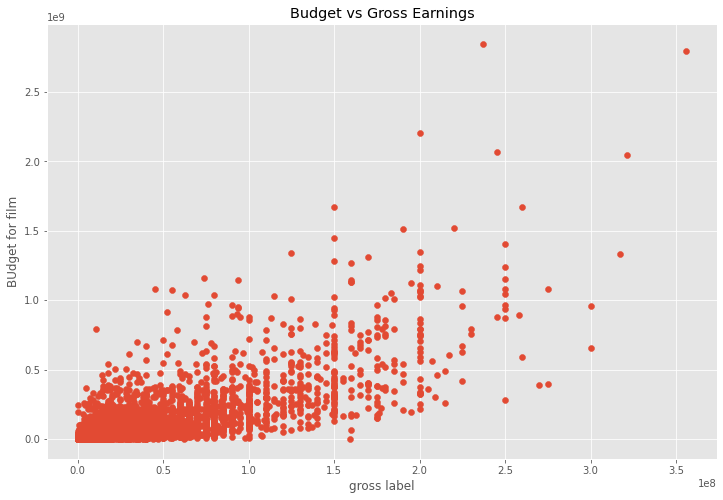

In [42]:
## lets build a scatter plot budget vs gross

plt.scatter(x= df['Budget'], y = df['Gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel("gross label")
plt.ylabel("BUdget for film")
plt.show()

<AxesSubplot:xlabel='Budget', ylabel='Gross'>

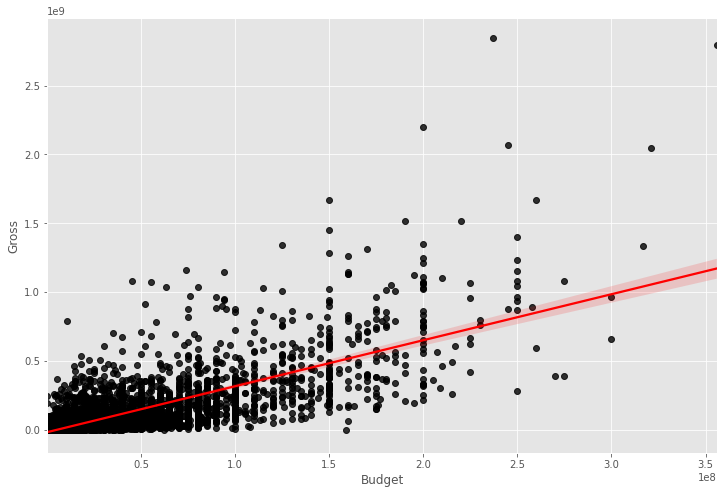

In [57]:
sns.regplot(x=df['Budget'], y=df['Gross'], data=df, scatter_kws = {"color":"black"}, line_kws = {"color":"red"})

In [61]:
## lets start looking at correlation . their are diff methods
## pearson, kendall, spearman
##df.corr(method = 'person') 
##df.corr(method = 'kendall') 
df.corr(method = 'spearman') 

,Year,Budget,Gross,Score,Votes
Year,1.000000,0.334883,0.377665,0.055248,0.434864
Budget,0.334883,1.000000,0.684412,0.004173,0.500427
Gross,0.377665,0.684412,1.000000,0.199921,0.757067
Score,0.055248,0.004173,0.199921,1.000000,0.500642
Votes,0.434864,0.500427,0.757067,0.500642,1.000000


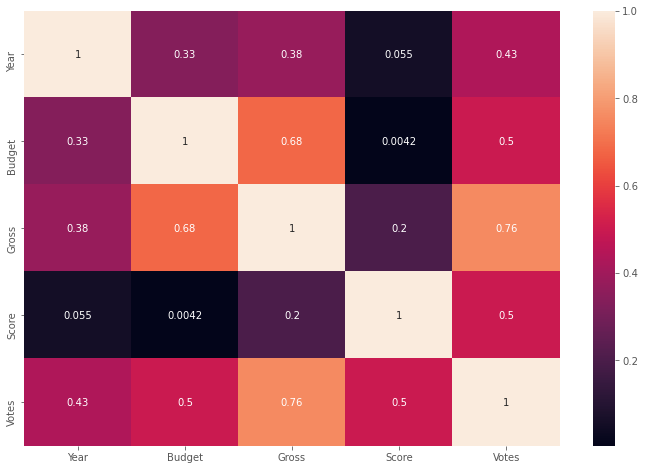

In [64]:
### High correlation between budget and gross
correlation_matrix = df.corr(method = 'spearman')
sns.heatmap(correlation_matrix, annot= True)
plt.show()

In [67]:
## now the correlation we are seeing is only between few columns which are in number ..rest columns whch are strings are not shown in 
## in this correlation so we have to change rest of the columns to numeric to see the correaltion of that too

df_numerized = df

for col_name in df_numerized.columns:
    if (df_numerized[col_name].dtype=='object'):
        df_numerized[col_name] =  df_numerized[col_name].astype('category')
        df_numerized[col_name] =  df_numerized[col_name].cat.codes
df_numerized       
        

,Company,Country,Director,Genre,Name,Rating,released,Star,Writer,Year,Budget,Gross,Runtime,Score,Votes,correct_year
5445,1296,41,752,0,374,5,588,1479,1222,2009,237000000.0,2.847246e+09,93,7.8,1100000.0,29
7445,924,41,102,0,376,5,1182,1415,495,2019,356000000.0,2.797501e+09,109,8.4,903000.0,39
3045,1296,41,752,6,4732,5,594,1034,1222,1997,200000000.0,2.201647e+09,117,7.8,1100000.0,17
6663,888,41,736,0,3522,5,590,345,1752,2015,245000000.0,2.069522e+09,69,7.8,876000.0,35
7244,924,41,102,0,377,5,1189,1415,495,2018,321000000.0,2.048360e+09,80,8.4,897000.0,38
7480,1334,41,971,2,4229,4,1745,438,1319,2019,260000000.0,1.670728e+09,49,6.9,222000.0,39
6653,1310,41,323,0,2049,5,1478,284,2445,2015,150000000.0,1.670516e+09,55,7.0,593000.0,35
6043,924,41,1017,0,3744,5,1422,1415,1597,2012,220000000.0,1.518816e+09,74,8.0,1300000.0,32
6646,1310,41,776,0,1491,5,1207,1717,463,2015,190000000.0,1.515341e+09,68,7.1,370000.0,35
7494,1333,41,267,2,1481,4,435,998,1341,2019,150000000.0,1.450027e+09,34,6.8,148000.0,39


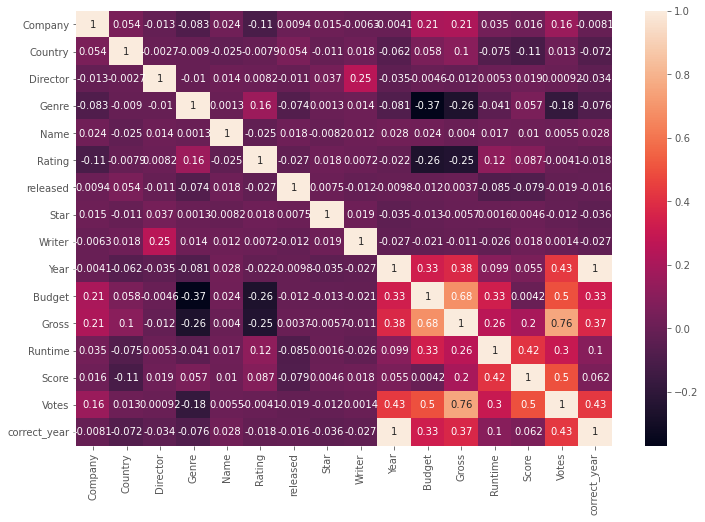

In [68]:
correlation_matrix = df_numerized.corr(method = 'spearman')
sns.heatmap(correlation_matrix, annot= True)
plt.show()

In [69]:
corr_mat = df_numerized.corr()
corr_pairs = corr_mat.unstack()
corr_pairs

Company       Company         1.000000
              Country         0.046834
              Director       -0.011503
              Genre          -0.073189
              Name            0.024041
              Rating         -0.091803
              released        0.008222
              Star            0.017851
              Writer         -0.006220
              Year           -0.010164
              Budget          0.168316
              Gross           0.149011
              Runtime         0.035068
              Score           0.023746
              Votes           0.117246
              correct_year   -0.013903
Country       Company         0.046834
              Country         1.000000
              Director        0.021057
              Genre          -0.004995
              Name           -0.023972
              Rating          0.007216
              released        0.038486
              Star           -0.008459
              Writer          0.024566
              Year       

In [70]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

Genre         Budget         -0.367332
Budget        Genre          -0.367332
Genre         Gross          -0.240808
Gross         Genre          -0.240808
Rating        Budget         -0.199951
Budget        Rating         -0.199951
Rating        Gross          -0.179344
Gross         Rating         -0.179344
Votes         Genre          -0.134182
Genre         Votes          -0.134182
Runtime       released       -0.093122
released      Runtime        -0.093122
Company       Rating         -0.091803
Rating        Company        -0.091803
Genre         Company        -0.073189
Company       Genre          -0.073189
Score         released       -0.073068
released      Score          -0.073068
Genre         Year           -0.072969
Year          Genre          -0.072969
correct_year  Genre          -0.069427
Genre         correct_year   -0.069427
released      Genre          -0.063572
Genre         released       -0.063572
Runtime       Genre          -0.063021
Genre         Runtime    

In [74]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

Votes         Gross           0.616042
Gross         Votes           0.616042
              Budget          0.738690
Budget        Gross           0.738690
Year          correct_year    0.999017
correct_year  Year            0.999017
Company       Company         1.000000
Score         Score           1.000000
Runtime       Runtime         1.000000
Gross         Gross           1.000000
Budget        Budget          1.000000
Year          Year            1.000000
Writer        Writer          1.000000
Star          Star            1.000000
released      released        1.000000
Rating        Rating          1.000000
Name          Name            1.000000
Genre         Genre           1.000000
Director      Director        1.000000
Country       Country         1.000000
Votes         Votes           1.000000
correct_year  correct_year    1.000000
dtype: float64